In [ ]:
  import os
# Path to the zip file in Google Drive
zip_path = '/content/drive/MyDrive/pathhole/Potholedetection.zip'

In [ ]:
import zipfile

# Destination directory to unzip the files
extract_dir = '/content/pathhole/Potholedetection'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

# List files to verify
for root, dirs, files in os.walk(extract_dir):
    for file in files:
        print(os.path.join(root, file))

/content/pathhole/Potholedetection/data.yaml
/content/pathhole/Potholedetection/README.dataset.txt
/content/pathhole/Potholedetection/README.roboflow.txt
/content/pathhole/Potholedetection/train/labels/261_jpg.rf.9a13ac61be23105268c1d8beb9ffa098.txt
/content/pathhole/Potholedetection/train/labels/91_jpg.rf.df7f7c1dfad236aa8124d005ecd03d5d.txt
/content/pathhole/Potholedetection/train/labels/5_jpg.rf.70ecf86781f55df1fa9eba7b5d9da604.txt
/content/pathhole/Potholedetection/train/labels/558_jpg.rf.82092388c72d836759659f0db3faecba.txt
/content/pathhole/Potholedetection/train/labels/340_jpg.rf.bfe91d98e32c5fed52293e78a7986037.txt
/content/pathhole/Potholedetection/train/labels/489_jpg.rf.b05f037b6fc18050f6e4849d4a77915e.txt
/content/pathhole/Potholedetection/train/labels/335_jpg.rf.22822453842306261dbfa1b7bbd159b1.txt
/content/pathhole/Potholedetection/train/labels/47_jpg.rf.22ee78ed7c1e428bdb06d169ea9d8522.txt
/content/pathhole/Potholedetection/train/labels/123_jpg.rf.32b68664e289497a25d8b7f

In [ ]:
!pip install ultralytics
!pip install -U ipywidgets
!pip install wandb


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 802.7/802.7 kB 12.5 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import pickle
from tensorflow.keras.utils import to_categorical
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from ultralytics import YOLO
import cv2
from PIL import Image
import torch
from torch import nn
import random

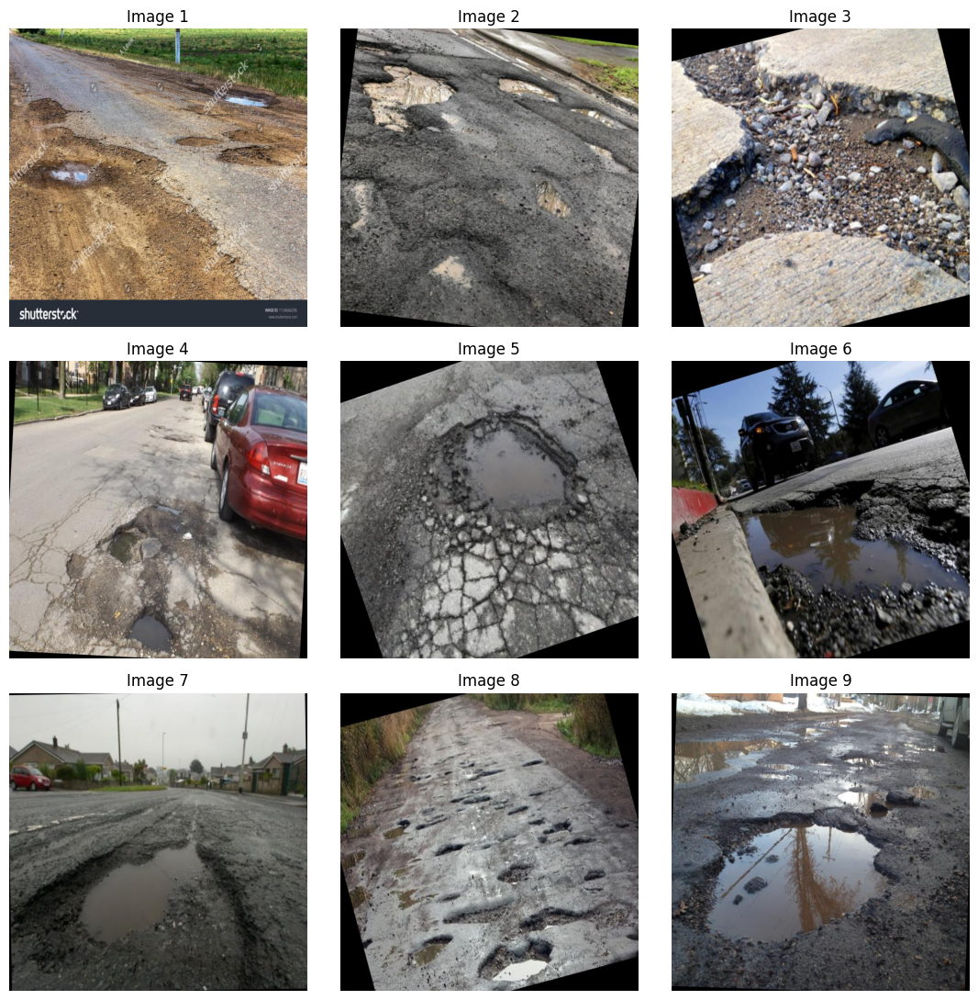

In [ ]:
Image_dir = '/content/pathhole/Potholedetection/train/images'

num_samples = 9
image_files = os.listdir(Image_dir)

# Randomly select num_samples images
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Get the size of the image
image = cv2.imread("/content/pathhole/Potholedetection/train/images/100_jpg.rf.83ec3078e25f9714cac5636c0f8d61e2.jpg")
h, w, c = image.shape
print(f"The image has dimensions {w}x{h} and {c} channels.")

The image has dimensions 640x640 and 3 channels.


In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import pickle
from tensorflow.keras.utils import to_categorical
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from ultralytics import YOLO
import cv2
from PIL import Image
import torch
from torch import nn
import random

In [ ]:
train_img_dir = '/content/pathhole/Potholedetection/train/images'
train_images = os.listdir(train_img_dir)

val_img_dir = '/content/pathhole/Potholedetection/valid/images'
val_images = os.listdir(val_img_dir)

train_labels_dir = '/content/pathhole/Potholedetection/train/labels'
val_labels_dir = '/content/pathhole/Potholedetection/valid/labels'

In [ ]:
label_list = ['pothole']

In [ ]:
def label_name(label_class):
    if 0 <= label_class < len(label_list):
        return label_list[label_class]
    else:
        return "none"

def load_labels(images, labels_dir):
    labels = []
    for img in images:
        label_path = os.path.join(labels_dir, img.replace('.jpg', '.txt'))
        try:
            with open(label_path, "r") as file:
                text = file.read().strip()
            if len(text) < 1:
                labels.append('None')
            else:
                labels.append(int(text.split()[0]))
        except FileNotFoundError:
            labels.append('None')
    return labels

train_labels = load_labels(train_images, train_labels_dir)
val_labels = load_labels(val_images, val_labels_dir)

def convert_labels(labels):
    return [int(label) if label != 'None' else -1 for label in labels]

train_labels = convert_labels(train_labels)
val_labels = convert_labels(val_labels)

In [ ]:
df_train = pd.DataFrame({
    'image_path': train_images,
    'label_class': train_labels
})
df_train['label_name'] = df_train['label_class'].apply(label_name)

df_val = pd.DataFrame({
    'image_path': val_images,
    'label_class': val_labels
})
df_val['label_name'] = df_val['label_class'].apply(label_name)


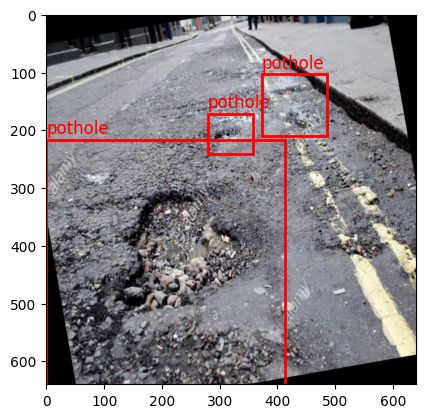

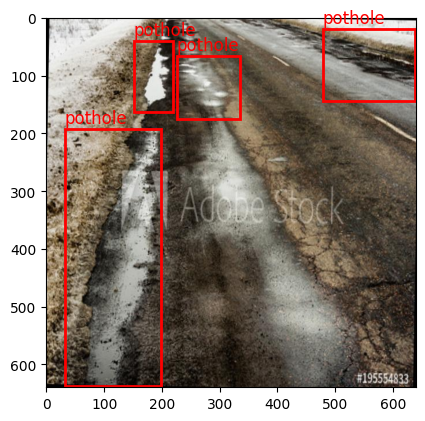

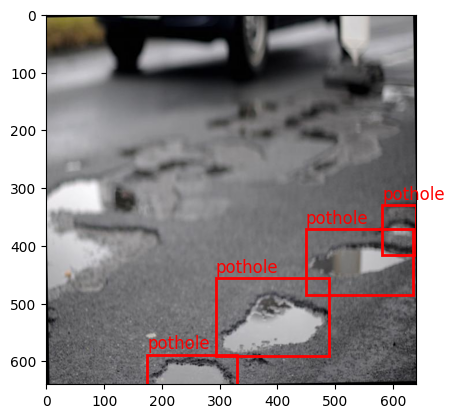

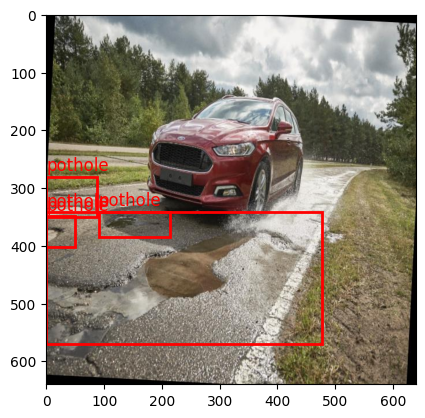

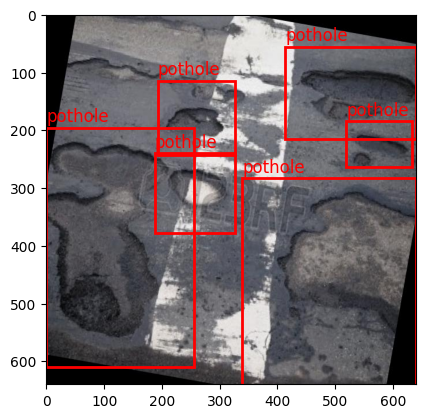

In [ ]:

import matplotlib.patches as patches

def plot_bounding_box(image_path, labels_dir):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    label_path = os.path.join(labels_dir, os.path.basename(image_path).replace('.jpg', '.txt'))
    fig, ax = plt.subplots(1)
    ax.imshow(img)
    try:
        with open(label_path, 'r') as file:
            for line in file:
                class_id, x_center, y_center, width, height = map(float, line.split())
                x_center, y_center, width, height = x_center * img.shape[1], y_center * img.shape[0], width * img.shape[1], height * img.shape[0]
                rect = patches.Rectangle((x_center - width / 2, y_center - height / 2), width, height, linewidth=2, edgecolor='r', facecolor='none')
                ax.add_patch(rect)
                plt.text(x_center - width / 2, y_center - height / 2 - 10, label_name(int(class_id)), color='r', fontsize=12)
    except FileNotFoundError:
        print(f"Label file not found for {image_path}")
    plt.show()


for img_path in df_train['image_path'].sample(5).values:
    plot_bounding_box(os.path.join(train_img_dir, img_path), train_labels_dir)

In [ ]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8 model
model = YOLO('yolov8n.pt')

# Train the model on the custom dataset
model.train(data='/content/pathhole/Potholedetection/data.yaml', epochs=30, imgsz=416)


100%|██████████| 6.25M/6.25M [00:00<00:00, 265MB/s]


Ultralytics YOLOv8.2.58 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/pathhole/Potholedetection/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sho

100%|██████████| 755k/755k [00:00<00:00, 112MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


AMP: checks passed ✅


train: Scanning /content/pathhole/Potholedetection/train/labels... 1245 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1245/1245 [00:02<00:00, 572.22it/s]


train: New cache created: /content/pathhole/Potholedetection/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/pathhole/Potholedetection/valid/labels... 120 images, 0 backgrounds, 0 corrupt: 100%|██████████| 120/120 [00:00<00:00, 398.85it/s]


val: New cache created: /content/pathhole/Potholedetection/valid/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      1.21G      1.952      2.277      1.789        101        416: 100%|██████████| 78/78 [00:27<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.19it/s]

                   all        120        492       0.27      0.301      0.215     0.0738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      1.02G      1.835      1.818      1.705        131        416: 100%|██████████| 78/78 [00:21<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.31it/s]

                   all        120        492      0.416      0.372      0.322      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      1.01G      1.857      1.791      1.709         64        416: 100%|██████████| 78/78 [00:21<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.01it/s]

                   all        120        492      0.382      0.429      0.352      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      1.02G      1.846      1.788      1.702         79        416: 100%|██████████| 78/78 [00:20<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.75it/s]

                   all        120        492      0.411      0.382      0.308      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      1.01G      1.822      1.723      1.681        103        416: 100%|██████████| 78/78 [00:21<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.99it/s]

                   all        120        492      0.433      0.372      0.338       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      1.01G       1.79      1.657       1.67         73        416: 100%|██████████| 78/78 [00:21<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.49it/s]

                   all        120        492      0.528      0.445      0.434      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      1.02G      1.765      1.589      1.625         91        416: 100%|██████████| 78/78 [00:21<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.81it/s]

                   all        120        492      0.576      0.441      0.469      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      1.02G      1.725      1.562      1.592         73        416: 100%|██████████| 78/78 [00:21<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.35it/s]

                   all        120        492      0.515      0.461      0.471      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      1.01G      1.715      1.551      1.589         50        416: 100%|██████████| 78/78 [00:20<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.31it/s]

                   all        120        492      0.545      0.443      0.458      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      1.01G      1.682      1.505      1.583        129        416: 100%|██████████| 78/78 [00:21<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.38it/s]

                   all        120        492      0.527      0.459      0.466      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      1.01G      1.695      1.515      1.575         94        416: 100%|██████████| 78/78 [00:21<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.15it/s]

                   all        120        492      0.607      0.482      0.501      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      1.01G      1.653      1.456      1.558         95        416: 100%|██████████| 78/78 [00:21<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]

                   all        120        492      0.599       0.49      0.511      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      1.02G      1.654      1.429      1.549         96        416: 100%|██████████| 78/78 [00:21<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.06it/s]

                   all        120        492      0.557      0.494      0.493      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      1.03G      1.644      1.425       1.55        121        416: 100%|██████████| 78/78 [00:20<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.53it/s]


                   all        120        492      0.576      0.504      0.511      0.193

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      1.03G      1.621      1.373      1.519         94        416: 100%|██████████| 78/78 [00:21<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.16it/s]

                   all        120        492      0.604      0.474      0.505       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      1.01G      1.617      1.373      1.542         72        416: 100%|██████████| 78/78 [00:21<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.76it/s]

                   all        120        492      0.623      0.508       0.54      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      1.02G      1.616      1.364      1.537         95        416: 100%|██████████| 78/78 [00:21<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.54it/s]

                   all        120        492      0.584      0.525      0.548      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      1.02G      1.598       1.33      1.506        144        416: 100%|██████████| 78/78 [00:21<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.25it/s]

                   all        120        492      0.599      0.522      0.541      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      1.02G      1.574      1.306      1.509         73        416: 100%|██████████| 78/78 [00:21<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.38it/s]

                   all        120        492      0.619      0.484      0.527      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      1.01G      1.557      1.284      1.488        111        416: 100%|██████████| 78/78 [00:20<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.28it/s]

                   all        120        492      0.683      0.482      0.545      0.216


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      1.15G      1.585      1.233      1.538         44        416: 100%|██████████| 78/78 [00:24<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.44it/s]

                   all        120        492      0.643      0.494      0.549       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      1.02G      1.539      1.166      1.506         46        416: 100%|██████████| 78/78 [00:21<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.97it/s]

                   all        120        492      0.649      0.492      0.554      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      1.01G      1.524       1.12       1.49         31        416: 100%|██████████| 78/78 [00:21<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.16it/s]

                   all        120        492      0.638      0.488      0.539      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      1.01G      1.503      1.082      1.478         37        416: 100%|██████████| 78/78 [00:20<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.37it/s]

                   all        120        492      0.615      0.533      0.573      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      1.02G      1.486      1.064      1.484         76        416: 100%|██████████| 78/78 [00:20<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.76it/s]

                   all        120        492      0.629       0.53      0.589      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      1.03G      1.448      1.027      1.453         50        416: 100%|██████████| 78/78 [00:20<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.22it/s]

                   all        120        492      0.669      0.524      0.596      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      1.02G      1.436     0.9965      1.441         71        416: 100%|██████████| 78/78 [00:20<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.77it/s]

                   all        120        492      0.595      0.557      0.582      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      1.01G      1.408     0.9736      1.435         24        416: 100%|██████████| 78/78 [00:21<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.78it/s]

                   all        120        492      0.664      0.525      0.597      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      1.02G      1.395     0.9508      1.418         58        416: 100%|██████████| 78/78 [00:20<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.63it/s]

                   all        120        492      0.671       0.53      0.578      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      1.02G      1.376     0.9243      1.395         63        416: 100%|██████████| 78/78 [00:21<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.17it/s]

                   all        120        492      0.724      0.507      0.595      0.244



30 epochs completed in 0.202 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.58 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.13it/s]


                   all        120        492      0.646      0.545      0.597      0.245
Speed: 0.4ms preprocess, 2.2ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▃▆███▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
lr/pg1,▃▆███▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
lr/pg2,▃▆███▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
metrics/mAP50(B),▁▃▄▃▃▅▆▆▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇███████
metrics/mAP50-95(B),▁▃▃▂▂▅▅▅▅▅▆▆▅▆▆▆▇▇▆▇▇▇▆███████
metrics/precision(B),▁▃▃▃▄▅▆▅▆▅▇▇▆▆▇▇▆▇▇█▇▇▇▇▇█▆██▇
metrics/recall(B),▁▃▄▃▃▅▅▅▅▅▆▆▆▇▆▇▇▇▆▆▆▆▆▇▇▇█▇▇█
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▇▇▇▆▆▆▅▅▅▅▄▄▄▄▄▄▄▃▃▄▃▃▃▂▂▂▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b9f070cb160>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:
trained_weights = "/content/runs/detect/train/weights/best.pt"
model = YOLO(trained_weights)

# Evaluate the model on the validation set
results = model.val(data = '/content/pathhole/Potholedetection/data.yaml')

# Print the evaluation metrics
# Accessing metrics using the appropriate methods
precision = results.box.mp # Mean precision
recall = results.box.mr    # Mean recall
mAP50 = results.box.map50  # mAP@0.5
mAP50_95 = results.box.map  # mAP@0.5:0.95

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"mAP@0.5: {mAP50}")
print(f"mAP@0.5:0.95: {mAP50_95}")


Ultralytics YOLOv8.2.58 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/pathhole/Potholedetection/valid/labels.cache... 120 images, 0 backgrounds, 0 corrupt: 100%|██████████| 120/120 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.56it/s]


                   all        120        492      0.648      0.545      0.598      0.246
Speed: 0.1ms preprocess, 6.5ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to runs/detect/val
Precision: 0.647944245512946
Recall: 0.5447154471544715
mAP@0.5: 0.5976026975178923
mAP@0.5:0.95: 0.24554490958732336


In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import pickle
from tensorflow.keras.utils import to_categorical
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from ultralytics import YOLO
import cv2
from PIL import Image
import torch
from torch import nn
import random

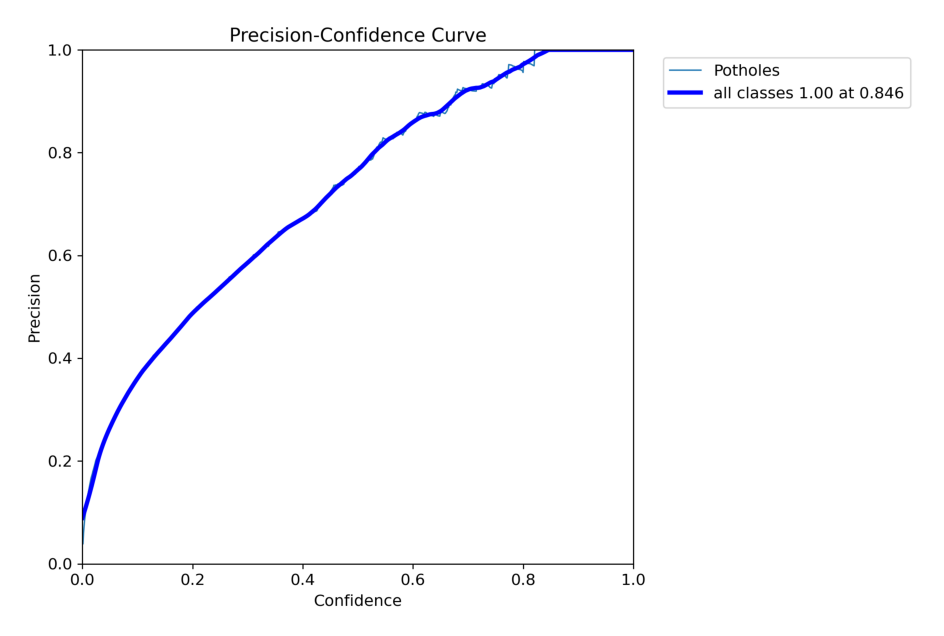

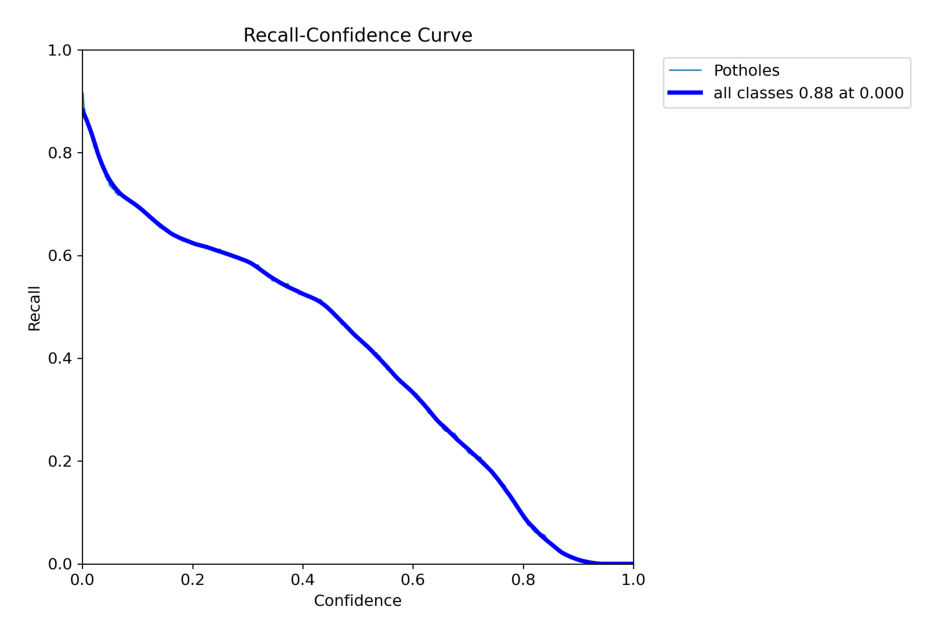

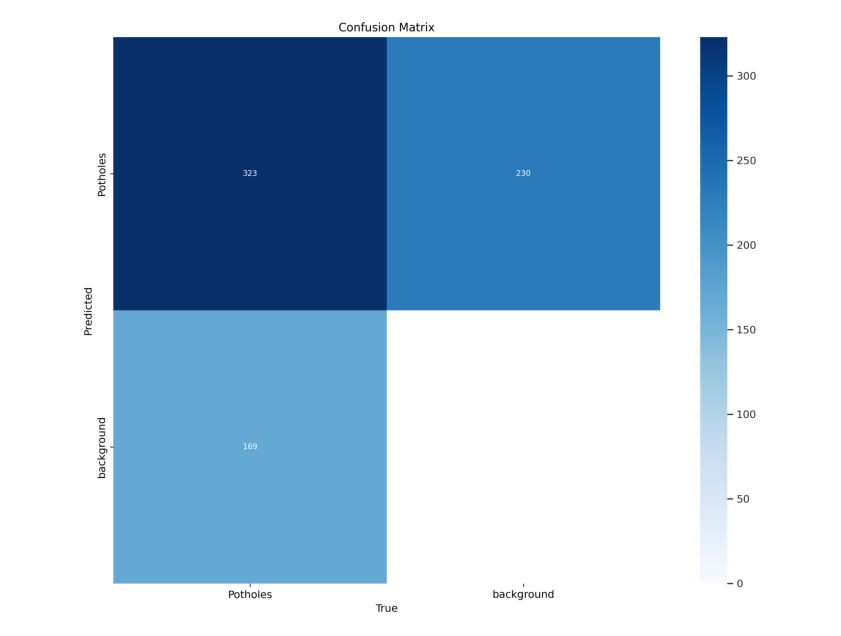

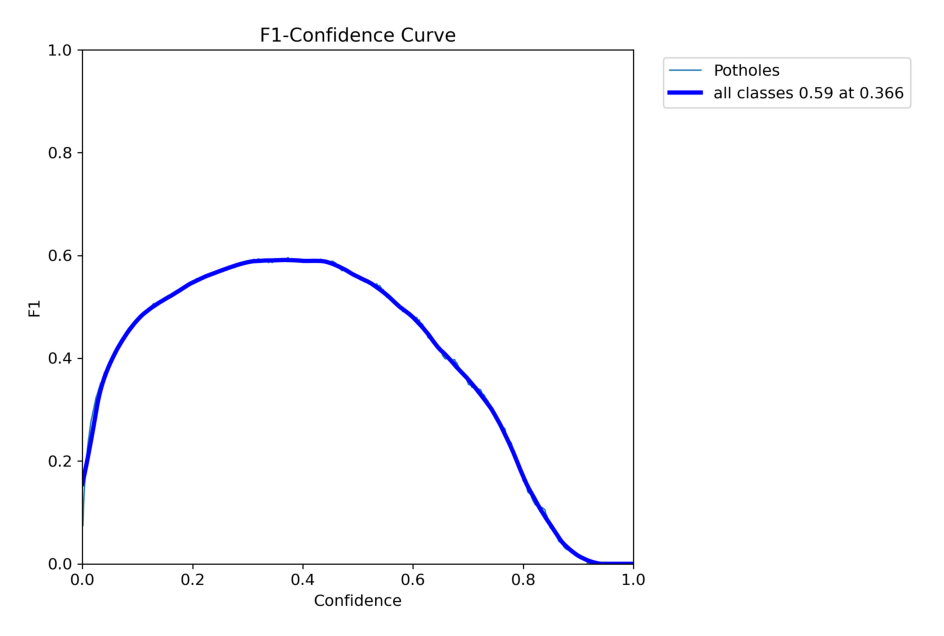

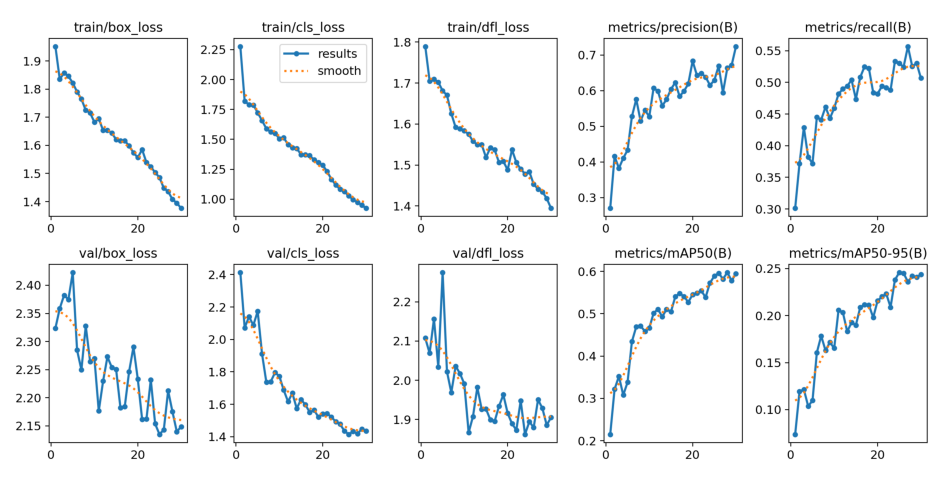

In [ ]:
list_of_metrics = ["P_curve.png", "R_curve.png", "confusion_matrix.png", "F1_curve.png", "results.png"]

for metric in list_of_metrics:
    image = Image.open(f'/content/runs/detect/train/{metric}')
    plt.figure(figsize=(12, 8))
    plt.axis("off")
    plt.imshow(image)
    plt.show()


In [ ]:
trained_weights = "/content/runs/detect/train/weights/best.pt"
model = YOLO(trained_weights)

In [ ]:
def test_visualization(images):
    output = model.predict(images)
    fig, axes = plt.subplots(3, 3, figsize=(11, 11))
    for i, r in enumerate(images):
        ax = axes[i // 3, i % 3]
        im_bgr = cv2.imread(r)
        im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image
        ax.axis('off')
        ax.set_title(f"Image {i}")
        ax.imshow(im_rgb)
    fig, axes = plt.subplots(3, 3, figsize=(11, 11))
    for i, r in enumerate(output):
        ax = axes[i // 3, i % 3]
        im_bgr = r.plot()  # BGR-order numpy array
        im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image
        ax.axis('off')
        ax.set_title(f"Image {i}")
        ax.imshow(im_rgb)



0: 416x416 1 Potholes, 30.8ms
1: 416x416 1 Potholes, 30.8ms
2: 416x416 3 Potholess, 30.8ms
3: 416x416 1 Potholes, 30.8ms
4: 416x416 16 Potholess, 30.8ms
5: 416x416 12 Potholess, 30.8ms
6: 416x416 3 Potholess, 30.8ms
7: 416x416 1 Potholes, 30.8ms
8: 416x416 2 Potholess, 30.8ms
Speed: 3.4ms preprocess, 30.8ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 416)


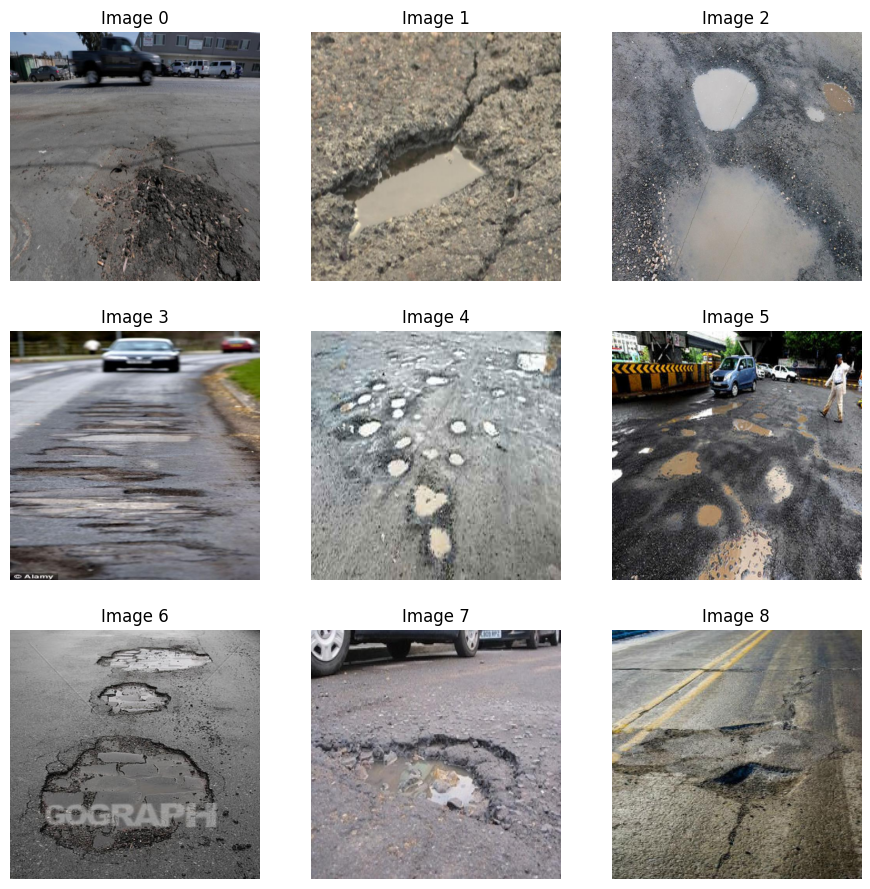

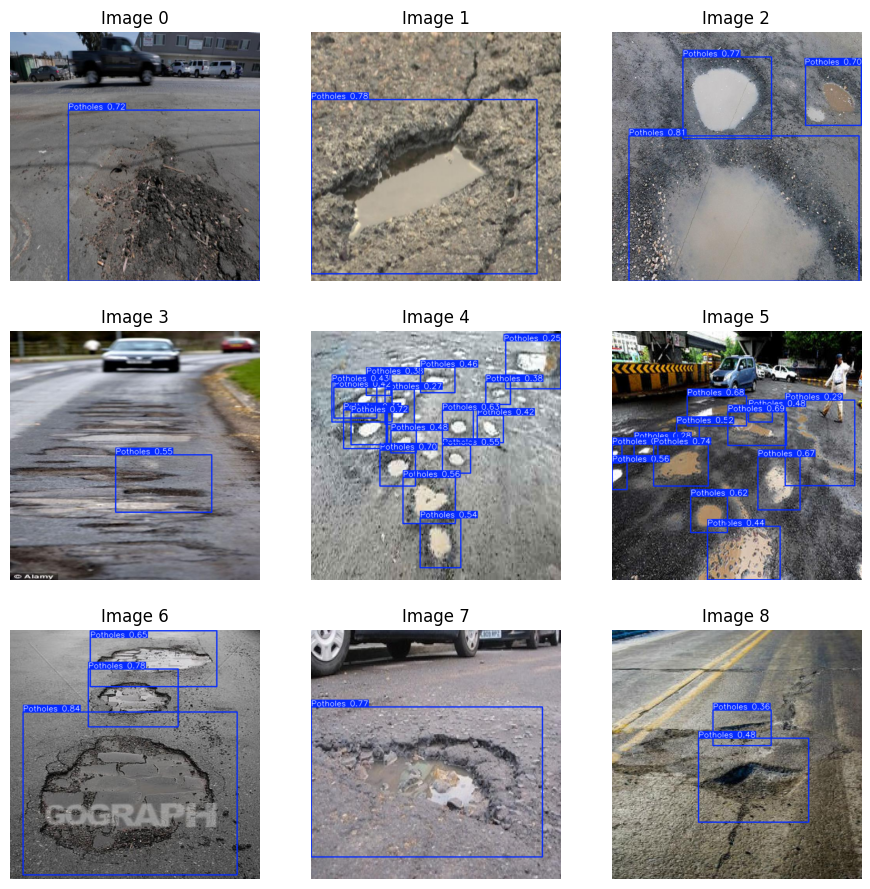

In [ ]:
test_img_dir = '/content/pathhole/Potholedetection/test/images'
test_images = os.listdir(test_img_dir)
test_img = [os.path.join(test_img_dir, img) for img in test_images[:9]]

test_visualization(test_img)

In [ ]:
from ultralytics import YOLO
import torch
import torch.nn as nn

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        assert kernel_size in (3, 7), 'kernel size must be 3 or 7'
        padding = 3 if kernel_size == 7 else 1

        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x = torch.cat([avg_out, max_out], dim=1)
        x = self.conv1(x)
        return self.sigmoid(x)

class YOLOv8WithSpatialAttention(YOLO):
    def __init__(self, model_path):
        super(YOLOv8WithSpatialAttention, self).__init__(model_path)
        self.spatial_attention = SpatialAttention()

    def forward(self, x):
        x = self.spatial_attention(x)
        return super(YOLOv8WithSpatialAttention, self).forward(x)

# Load the base YOLOv8 model and wrap it with spatial attention
base_model_path = 'yolov8n.pt'
model = YOLOv8WithSpatialAttention(base_model_path)

# Define your dataset paths
dataset_yaml = '''
train: /content/pathhole/Potholedetection/train/images
val: /content/pathhole/Potholedetection/valid/images

nc: 1  # number of classes
names: ['pothole']
'''

# Save the dataset YAML to a file
with open('/content/pathhole/Potholedetection/data.yaml', 'w') as f:
    f.write(dataset_yaml)

# Train the model on the custom dataset
model.train(data='/content/pathhole/Potholedetection/data.yaml', epochs=30, imgsz=416)


Ultralytics YOLOv8.2.58 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/pathhole/Potholedetection/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sh

wandb: Currently logged in as: laxmigovini19 (laxmigovini19-SR University). Use `wandb login --relogin` to force relogin


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅


train: Scanning /content/pathhole/Potholedetection/train/labels.cache... 1245 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1245/1245 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/pathhole/Potholedetection/valid/labels.cache... 120 images, 0 backgrounds, 0 corrupt: 100%|██████████| 120/120 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      1.25G      1.952      2.277      1.789        101        416: 100%|██████████| 78/78 [00:27<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.63it/s]

                   all        120        492       0.27      0.301      0.215     0.0738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      1.04G      1.835      1.818      1.705        131        416: 100%|██████████| 78/78 [00:22<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.64it/s]

                   all        120        492      0.416      0.372      0.322      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      1.03G      1.857      1.791      1.709         64        416: 100%|██████████| 78/78 [00:21<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.45it/s]

                   all        120        492      0.382      0.429      0.352      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      1.03G      1.846      1.788      1.702         79        416: 100%|██████████| 78/78 [00:22<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.33it/s]

                   all        120        492      0.411      0.382      0.308      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      1.03G      1.822      1.723      1.681        103        416: 100%|██████████| 78/78 [00:23<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.50it/s]

                   all        120        492      0.433      0.372      0.338       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      1.03G       1.79      1.657       1.67         73        416: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.69it/s]

                   all        120        492      0.528      0.445      0.434      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      1.04G      1.765      1.589      1.625         91        416: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.69it/s]

                   all        120        492      0.576      0.441      0.469      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      1.04G      1.725      1.562      1.592         73        416: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.28it/s]

                   all        120        492      0.515      0.461      0.471      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      1.03G      1.715      1.551      1.589         50        416: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.69it/s]

                   all        120        492      0.545      0.443      0.458      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      1.04G      1.682      1.505      1.583        129        416: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.08it/s]

                   all        120        492      0.527      0.459      0.466      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      1.04G      1.695      1.515      1.575         94        416: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.14it/s]

                   all        120        492      0.607      0.482      0.501      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      1.03G      1.653      1.456      1.558         95        416: 100%|██████████| 78/78 [00:23<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.28it/s]

                   all        120        492      0.599       0.49      0.511      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      1.03G      1.654      1.429      1.549         96        416: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.18it/s]

                   all        120        492      0.557      0.494      0.493      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      1.05G      1.644      1.425       1.55        121        416: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.39it/s]

                   all        120        492      0.576      0.504      0.511      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      1.03G      1.621      1.373      1.519         94        416: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.28it/s]

                   all        120        492      0.604      0.474      0.505       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      1.04G      1.617      1.373      1.542         72        416: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.64it/s]

                   all        120        492      0.623      0.508       0.54      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      1.04G      1.616      1.364      1.537         95        416: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.12it/s]

                   all        120        492      0.584      0.525      0.548      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      1.03G      1.598       1.33      1.506        144        416: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.65it/s]


                   all        120        492      0.599      0.522      0.541      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      1.04G      1.574      1.306      1.509         73        416: 100%|██████████| 78/78 [00:22<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.46it/s]

                   all        120        492      0.619      0.484      0.527      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      1.03G      1.557      1.284      1.488        111        416: 100%|██████████| 78/78 [00:23<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.59it/s]

                   all        120        492      0.683      0.482      0.545      0.216


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      1.16G      1.585      1.233      1.538         44        416: 100%|██████████| 78/78 [00:25<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.13it/s]

                   all        120        492      0.643      0.494      0.549       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      1.04G      1.539      1.166      1.506         46        416: 100%|██████████| 78/78 [00:22<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.15it/s]

                   all        120        492      0.649      0.492      0.554      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      1.04G      1.524       1.12       1.49         31        416: 100%|██████████| 78/78 [00:22<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.29it/s]

                   all        120        492      0.638      0.488      0.539      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      1.03G      1.503      1.082      1.478         37        416: 100%|██████████| 78/78 [00:23<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.29it/s]

                   all        120        492      0.615      0.533      0.573      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      1.03G      1.486      1.064      1.484         76        416: 100%|██████████| 78/78 [00:23<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.22it/s]

                   all        120        492      0.629       0.53      0.589      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      1.05G      1.448      1.027      1.453         50        416: 100%|██████████| 78/78 [00:22<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.77it/s]

                   all        120        492      0.669      0.524      0.596      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      1.03G      1.436     0.9965      1.441         71        416: 100%|██████████| 78/78 [00:23<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.34it/s]

                   all        120        492      0.595      0.557      0.582      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      1.04G      1.408     0.9736      1.435         24        416: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.35it/s]

                   all        120        492      0.664      0.525      0.597      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      1.04G      1.395     0.9508      1.418         58        416: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.31it/s]

                   all        120        492      0.671       0.53      0.578      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      1.03G      1.376     0.9243      1.395         63        416: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.66it/s]

                   all        120        492      0.724      0.507      0.595      0.244



30 epochs completed in 0.221 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.2.58 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.03s/it]


                   all        120        492      0.646      0.545      0.597      0.245
Speed: 0.3ms preprocess, 3.9ms inference, 0.0ms loss, 6.3ms postprocess per image
Results saved to runs/detect/train2


lr/pg0,▃▆███▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
lr/pg1,▃▆███▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
lr/pg2,▃▆███▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
metrics/mAP50(B),▁▃▄▃▃▅▆▆▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇███████
metrics/mAP50-95(B),▁▃▃▂▂▅▅▅▅▅▆▆▅▆▆▆▇▇▆▇▇▇▆███████
metrics/precision(B),▁▃▃▃▄▅▆▅▆▅▇▇▆▆▇▇▆▇▇█▇▇▇▇▇█▆██▇
metrics/recall(B),▁▃▄▃▃▅▅▅▅▅▆▆▆▇▆▇▇▇▆▆▆▆▆▇▇▇█▇▇█
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▇▇▇▆▆▆▅▅▅▅▄▄▄▄▄▄▄▃▃▄▃▃▃▂▂▂▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b9f07537700>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:
trained_weights = "/content/runs/detect/train2/weights/best.pt"
model = YOLO(trained_weights)

# Evaluate the model on the validation set
results = model.val(data = '/content/pathhole/Potholedetection/data.yaml')

# Print the evaluation metrics
# Accessing metrics using the appropriate methods
precision = results.box.mp # Mean precision
recall = results.box.mr    # Mean recall
mAP50 = results.box.map50  # mAP@0.5
mAP50_95 = results.box.map  # mAP@0.5:0.95

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"mAP@0.5: {mAP50}")
print(f"mAP@0.5:0.95: {mAP50_95}")


Ultralytics YOLOv8.2.58 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/pathhole/Potholedetection/valid/labels.cache... 120 images, 0 backgrounds, 0 corrupt: 100%|██████████| 120/120 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:09<00:00,  1.22s/it]


                   all        120        492      0.648      0.545      0.598      0.246
Speed: 0.8ms preprocess, 9.8ms inference, 0.0ms loss, 12.2ms postprocess per image
Results saved to runs/detect/val2
Precision: 0.647944245512946
Recall: 0.5447154471544715
mAP@0.5: 0.5976026975178923
mAP@0.5:0.95: 0.24554490958732336


In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import pickle
from tensorflow.keras.utils import to_categorical
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from ultralytics import YOLO
import cv2
from PIL import Image
import torch
from torch import nn
import random

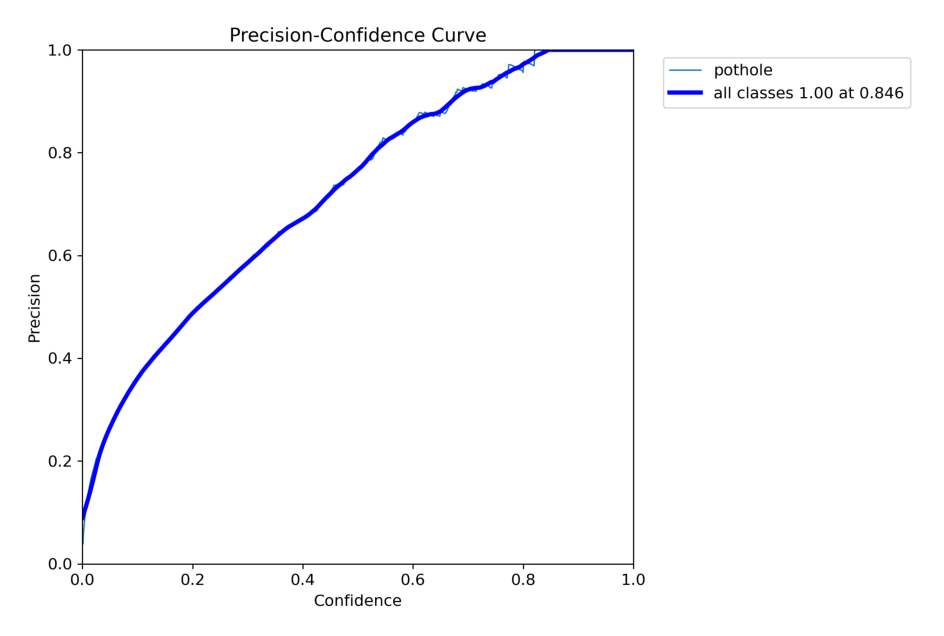

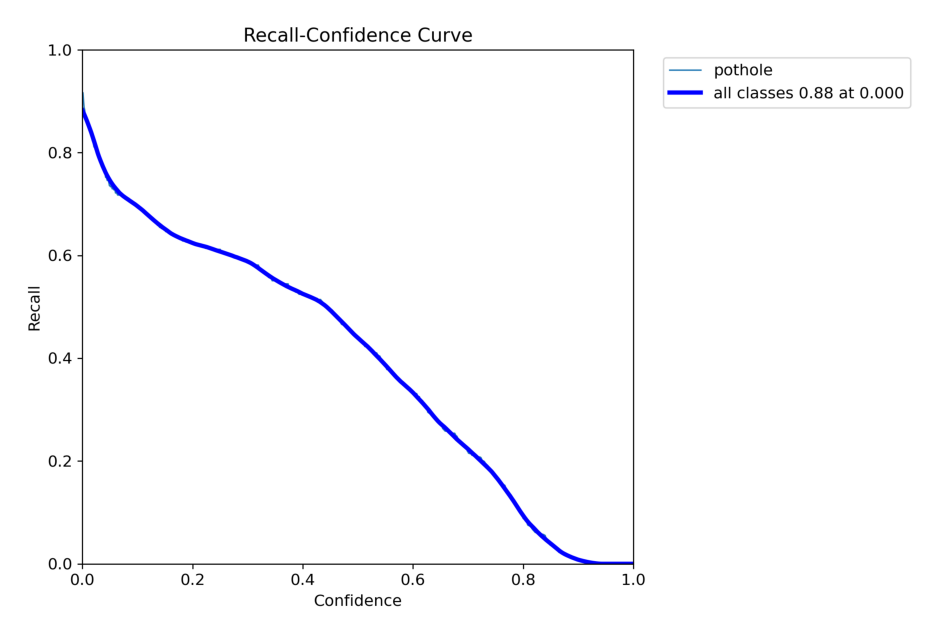

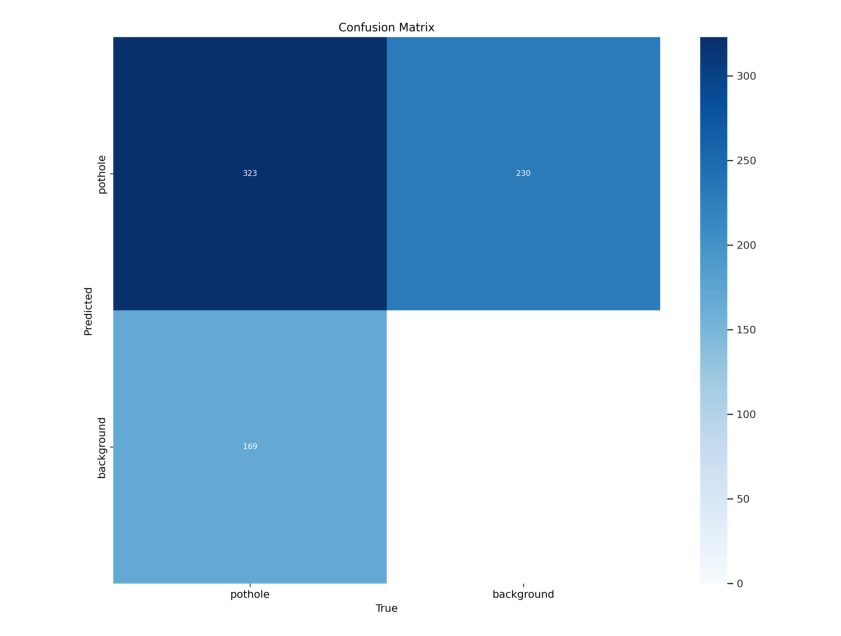

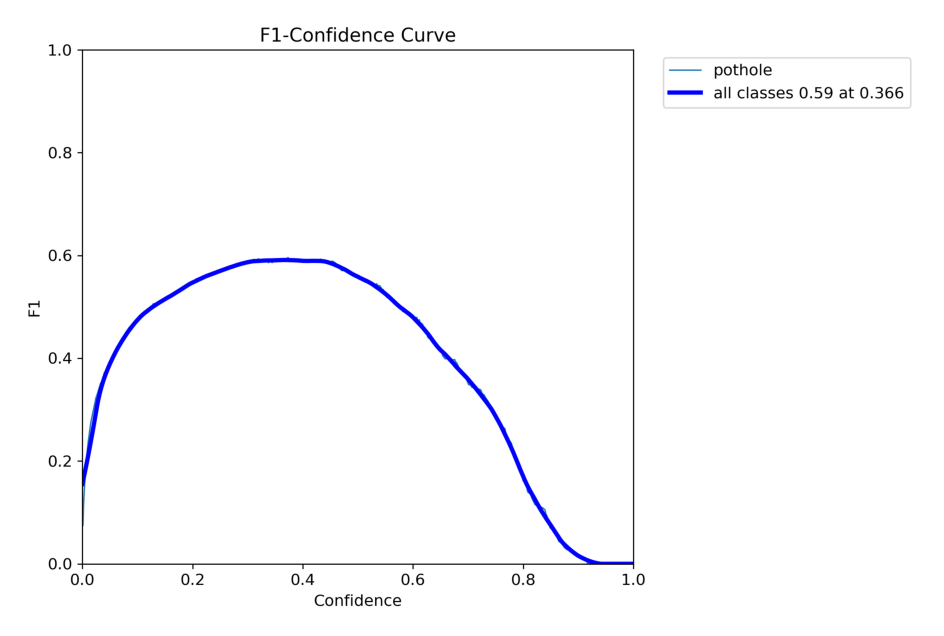

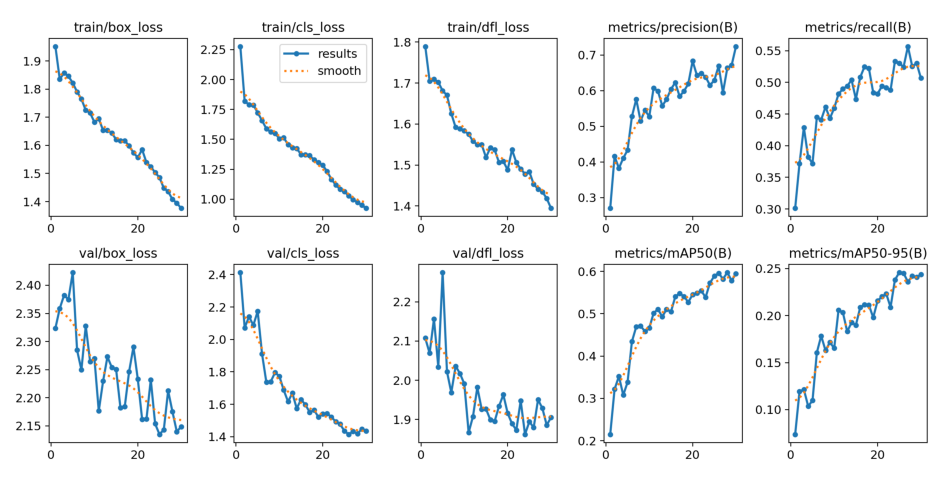

In [ ]:
list_of_metrics = ["P_curve.png", "R_curve.png", "confusion_matrix.png", "F1_curve.png", "results.png"]

for metric in list_of_metrics:
    image = Image.open(f'/content/runs/detect/train2/{metric}')
    plt.figure(figsize=(12, 8))
    plt.axis("off")
    plt.imshow(image)
    plt.show()


In [ ]:
trained_weights = "/content/runs/detect/train2/weights/best.pt"
model = YOLO(trained_weights)

In [ ]:
def test_visualization(images):
    output = model.predict(images)
    fig, axes = plt.subplots(3, 3, figsize=(11, 11))
    for i, r in enumerate(images):
        ax = axes[i // 3, i % 3]
        im_bgr = cv2.imread(r)
        im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image
        ax.axis('off')
        ax.set_title(f"Image {i}")
        ax.imshow(im_rgb)
    fig, axes = plt.subplots(3, 3, figsize=(11, 11))
    for i, r in enumerate(output):
        ax = axes[i // 3, i % 3]
        im_bgr = r.plot()  # BGR-order numpy array
        im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image
        ax.axis('off')
        ax.set_title(f"Image {i}")
        ax.imshow(im_rgb)



0: 416x416 1 pothole, 3.7ms
1: 416x416 1 pothole, 3.7ms
2: 416x416 3 potholes, 3.7ms
3: 416x416 1 pothole, 3.7ms
4: 416x416 16 potholes, 3.7ms
5: 416x416 12 potholes, 3.7ms
6: 416x416 3 potholes, 3.7ms
7: 416x416 1 pothole, 3.7ms
8: 416x416 2 potholes, 3.7ms
Speed: 3.1ms preprocess, 3.7ms inference, 3.0ms postprocess per image at shape (1, 3, 416, 416)


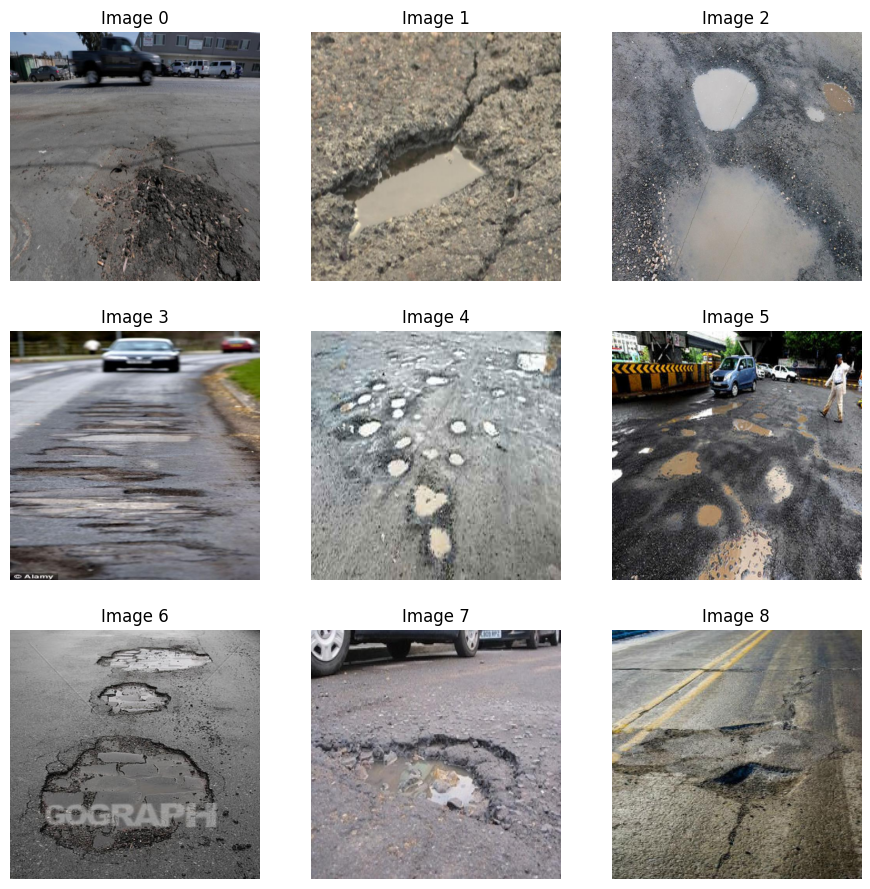

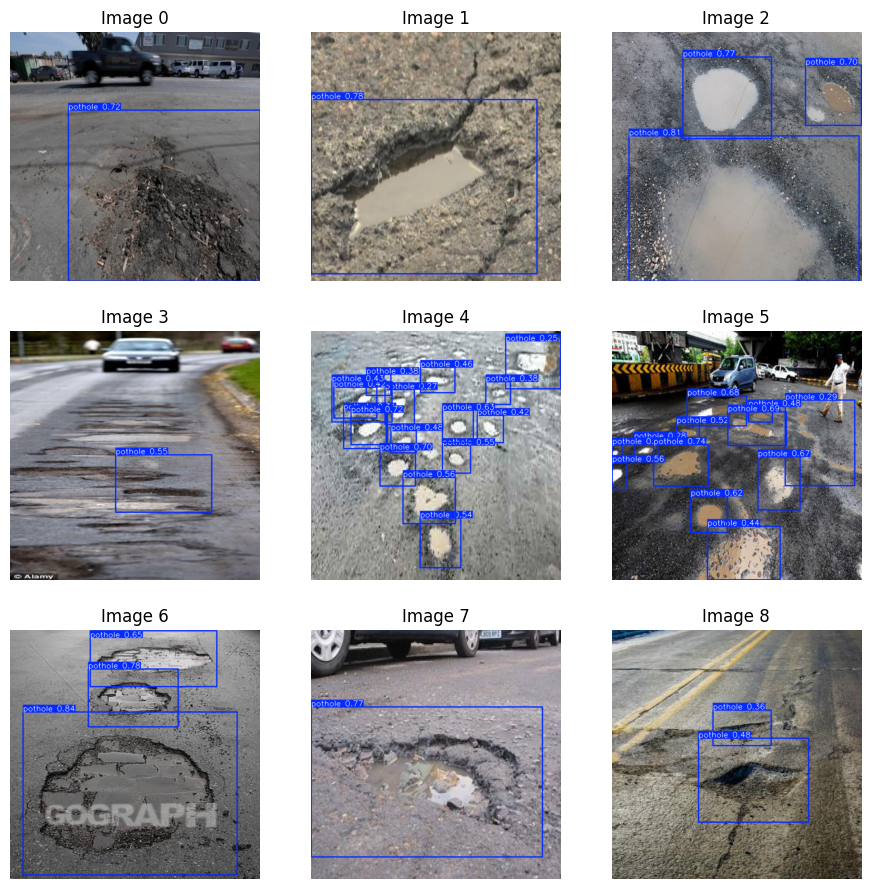

In [ ]:
test_img_dir = '/content/pathhole/Potholedetection/test/images'
test_images = os.listdir(test_img_dir)
test_img = [os.path.join(test_img_dir, img) for img in test_images[:9]]

test_visualization(test_img)

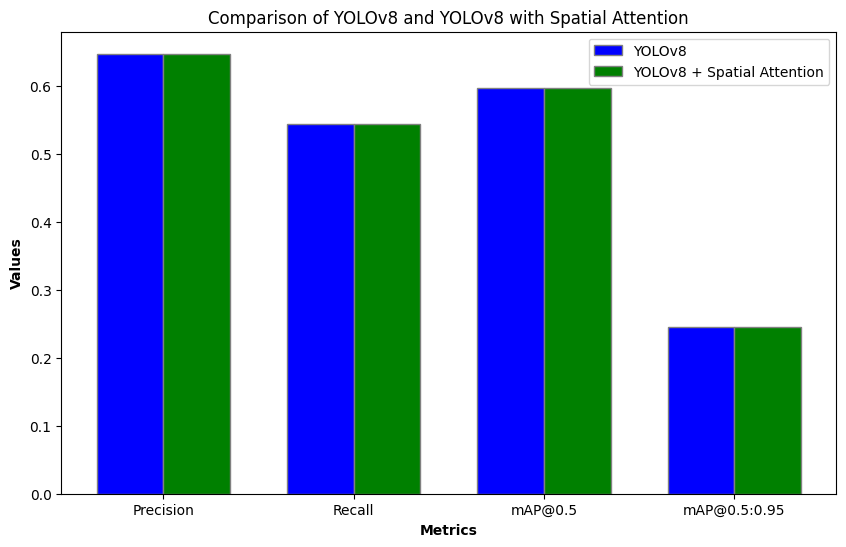

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Metrics for YOLOv8
yolo_v8_metrics = {
    'Precision': 0.647944245512946,
    'Recall': 0.5447154471544715,
    'mAP@0.5': 0.5976026975178923,
    'mAP@0.5:0.95': 0.24554490958732336
}


# Metrics for YOLOv8 with Spatial Attention
yolo_v8_sa_metrics = {
    'Precision': 0.647944245512946,
    'Recall': 0.5447154471544715,
    'mAP@0.5': 0.5976026975178923,
    'mAP@0.5:0.95': 0.24554490958732336
}

# Names of the metrics
metrics = list(yolo_v8_metrics.keys())

# Values of the metrics
yolo_v8_values = list(yolo_v8_metrics.values())
yolo_v8_sa_values = list(yolo_v8_sa_metrics.values())

# Bar width
bar_width = 0.35

# Positions of the bars on the x-axis
r1 = np.arange(len(metrics))
r2 = [x + bar_width for x in r1]

# Create the plot
plt.figure(figsize=(10, 6))

# Plot bars
plt.bar(r1, yolo_v8_values, color='blue', width=bar_width, edgecolor='grey', label='YOLOv8')
plt.bar(r2, yolo_v8_sa_values, color='green', width=bar_width, edgecolor='grey', label='YOLOv8 + Spatial Attention')

# Add labels
plt.xlabel('Metrics', fontweight='bold')
plt.ylabel('Values', fontweight='bold')
plt.title('Comparison of YOLOv8 and YOLOv8 with Spatial Attention')
plt.xticks([r + bar_width / 2 for r in range(len(metrics))], metrics)

# Add legend
plt.legend()

# Display the plot
plt.show()
